In [1]:
from astropy.table import Table
import numpy as np
import matplotlib.pyplot as plt
import os
import pandas as pd
import json

# IntraSom immports
import intrasom
from intrasom.visualization import PlotFactory
from intrasom.clustering import ClusterFactory


In [2]:
root_path = "/home/mike/git/computational_astro/astro_iqa"
data_path = "data/processed"
catalog_name = "som_objects_catalog.hdf5"

# Read the catalog with pandas
filename = os.path.join(root_path, data_path, catalog_name)
columns = ["OBJECT_ID", "FITS_ID", "CCD_ID", "ISO0", "BACKGROUND", "ELLIPTICITY", "ELONGATION", "CLASS_STAR", "FLAGS", "EXPTIME"]
# catalog = pd.read_hdf(filename, columns=columns)
catalog = Table.read(filename, path="som_catalog", format="hdf5")

print("Overview of the catalog:")
print(catalog.info())

Overview of the catalog:
<Table length=2104028>
    name     dtype 
----------- -------
    FITS_ID bytes12
     CCD_ID   uint8
  OBJECT_ID bytes32
       ISO0 float32
 BACKGROUND float32
ELLIPTICITY float32
 ELONGATION float32
 CLASS_STAR float32
      FLAGS   int16
    EXPTIME float32
    X_IMAGE float32
    Y_IMAGE float32
None


In [11]:
catalog_df = catalog.to_pandas()

# Select the columns to be used for clustering
var_names = ["OBJECT_ID", "ISO0", "BACKGROUND", "ELLIPTICITY", "ELONGATION", "CLASS_STAR", "FLAGS", "EXPTIME"]
component_names = ["ISO0", "BACKGROUND", "ELLIPTICITY", "ELONGATION", "CLASS_STAR", "FLAGS", "EXPTIME"]
catalog_df = catalog_df[var_names]

# Convert the OBJECT_ID to string
catalog_df["OBJECT_ID"] = catalog_df["OBJECT_ID"].apply(lambda x: x.decode('utf-8'))
# catalog_df["OBJECT_ID"] = bytes.fromhex(catalog_df["OBJECT_ID"].hex()).decode('utf-8')
object_id = catalog_df["OBJECT_ID"]
catalog_df.set_index(catalog_df.columns[0], inplace=True)

print(catalog_df.head())
mapsize = (15, 15)

som = intrasom.SOMFactory.build(catalog_df,
                                mapsize=mapsize,
                                mapshape="planar",
                                lattice="hexa",
                                normalization="var",
                                initialization="random",
                                neighborhood="gaussian",
                                training="batch",
                                name="som_iqa",
                                component_names=component_names,
                                unit_names=None,
                                sample_names=object_id.to_list(),
                                missing=False,
                                save_nan_hist=False,
                                pred_size=0)

                                      ISO0  BACKGROUND  ELLIPTICITY  \
OBJECT_ID                                                             
057970e69b654b1ea6066ff6e2ceb89a  3.445137         2.0     0.782642   
fe42a43758b8437eb89fb3f4c384f708  2.834421         2.0     0.737746   
e0ff049eb93645f68b640c94e865a079  3.457579         2.0     0.511490   
fdc5c1ff1e9048b09c97c55942e9a446  3.439964         2.0     0.475860   
a360c4f1d508437b9ae022fb1334d1cb  3.480582         2.0     0.667105   

                                  ELONGATION  CLASS_STAR  FLAGS   EXPTIME  
OBJECT_ID                                                                  
057970e69b654b1ea6066ff6e2ceb89a    4.600694    0.000330      2  1.477121  
fe42a43758b8437eb89fb3f4c384f708    3.813092    0.000360      2  1.477121  
e0ff049eb93645f68b640c94e865a079    2.047043    0.040931      2  1.477121  
fdc5c1ff1e9048b09c97c55942e9a446    1.907887    0.000322      2  1.477121  
a360c4f1d508437b9ae022fb1334d1cb    3.003952  

Creating Neuron Distance Rows:   0%|          | 0/240 [00:00<?, ? Neurons/s]

In [12]:
som.train(n_job=4,
        train_len_factor=2)

Starting Training...
Rough Training:


  0%|          | 0/2 [00:00<?, ?it/s]

Fine Tuning:


  0%|          | 0/2 [00:00<?, ?it/s]

Saving...
Training Report Created
Training completed successfully.


In [13]:
# Loading the trained SOM
bmus = pd.read_parquet("Results/som_iqa_neurons.parquet")
params = json.load(open("Results/params_som_iqa.json", encoding='utf-8'))

In [14]:
som_test = intrasom.SOMFactory.load_som(data = catalog_df,
                                       trained_neurons = bmus,
                                       params = params)

som_test.results_dataframe

Loading data...
Loading dataframe...
Normalizing data...
Creating neighborhood...
Creating missing data database
Creating codebook...
Loading distances matrix...
Initializing map...


Creating Neuron Distance Rows:   0%|          | 0/240 [00:00<?, ? Neurons/s]

,BMU,q-error,Udist,Ret_x,Ret_y,Cub_x,Cub_y,Cub_z,B_ISO0,B_BACKGROUND,B_ELLIPTICITY,B_ELONGATION,B_CLASS_STAR,B_FLAGS,B_EXPTIME
057970e69b654b1ea6066ff6e2ceb89a,239,0.0,0.014846,13,15,6,-21,15,2.506946,1.999936,0.711281,4.911489,0.013750,2.011748,1.447541
fe42a43758b8437eb89fb3f4c384f708,239,0.0,0.014846,13,15,6,-21,15,2.506946,1.999936,0.711281,4.911489,0.013750,2.011748,1.447541
e0ff049eb93645f68b640c94e865a079,239,0.0,0.014846,13,15,6,-21,15,2.506946,1.999936,0.711281,4.911489,0.013750,2.011748,1.447541
fdc5c1ff1e9048b09c97c55942e9a446,239,0.0,0.014846,13,15,6,-21,15,2.506946,1.999936,0.711281,4.911489,0.013750,2.011748,1.447541
a360c4f1d508437b9ae022fb1334d1cb,239,0.0,0.014846,13,15,6,-21,15,2.506946,1.999936,0.711281,4.911489,0.013750,2.011748,1.447541
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
a441caa248d948efae5087b15d8fa1d4,6,0.0,0.233089,5,0,5,-5,0,1.253587,1.988320,0.484311,2.255317,0.016144,0.296244,0.693550
ba8fcf38be464484ba3b736bbcfa645a,6,0.0,0.233089,5,0,5,-5,0,1.253587,1.988320,0.484311,2.255317,0.016144,0.296244,0.693550
0f5406ec5eb84d8a9516d799e848c522,6,0.0,0.233089,5,0,5,-5,0,1.253587,1.988320,0.484311,2.255317,0.016144,0.296244,0.693550
8184b989167c4cdf8077f53aca2a66ef,59,0.0,0.163892,13,3,12,-15,3,1.072882,1.994144,0.504813,3.257824,0.852580,0.622493,1.339661


In [15]:
som_test.neurons_dataframe

,BMU,Udist,Ret_x,Ret_y,Cub_x,Cub_y,Cub_z,B_ISO0,B_BACKGROUND,B_ELLIPTICITY,B_ELONGATION,B_CLASS_STAR,B_FLAGS,B_EXPTIME
1,1,1.000000,0,0,0,0,0,2.851003,-1.015297,0.819078,106.860892,0.119544,5.469828,0.484925
2,2,0.790548,1,0,1,-1,0,2.379404,-0.322029,0.765129,62.769521,0.190055,3.938236,0.202932
3,3,0.643570,2,0,2,-2,0,1.619625,0.874453,0.725898,22.334452,0.230713,2.528619,0.133010
4,4,0.389017,3,0,3,-3,0,1.112326,1.695312,0.698970,5.932864,0.148163,1.786581,0.312025
5,5,0.300830,4,0,4,-4,0,1.072340,1.927650,0.621446,3.337052,0.062754,1.094929,0.505002
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
236,236,0.012730,10,15,3,-18,15,1.761231,1.999890,0.754541,4.850361,0.002842,2.000301,1.435784
237,237,0.124008,11,15,4,-19,15,1.932074,1.999932,0.748769,4.869497,0.004988,2.002573,1.449181
238,238,0.107219,12,15,5,-20,15,2.376594,1.999939,0.728188,4.977103,0.011857,2.009570,1.448933
239,239,0.014846,13,15,6,-21,15,2.506946,1.999936,0.711281,4.911489,0.013750,2.011748,1.447541


In [16]:
# Representative sample of the SOM
rep_dic = som_test.rep_sample(save=True)
# Ordering BMUs in ascending order
sorted_dict = dict(sorted(rep_dic.items()))
sorted_dict

{1: ['084c7250b8414345a3fd1a0dcff9dd11',
  'd14af9503dea47c2bb24f31af07a838a',
  '68e8be6b8fde4ad3864f3024eb67f917',
  'e87502de2fe74142a60956a0c681b7d0',
  '7bb563fc9d3e4df1ae954799d7329658',
  '1e7d77a296974ad0a1852812ccba7c1e',
  'f0938a24344b4c46bdb1d387558de3f6',
  'b349bb2002454b1fb15b0dbf52b671f7',
  '50fae8e5f9654b09af2c682a20af2f98',
  '70dc2739f034423c9090cd7514929ade',
  '20877dbd980f4139b1a88238d08f5e22',
  '1e6e731a897e4d67af83f55f84835544',
  'e33310bbe1bc4f8b8ffd2c25b0b8537e',
  '2853c3162b644848b92f25f9a89fa950',
  '9f464db4c61246528b6669ea060fedc4',
  '34e7097b27ad4c56a08b270981c25b23',
  'd867c1344f334249baa6fc5c2f578b1a',
  'cf4d99d159dc432fa38c598e8e934444',
  'ec3363770e2b407c963ab42ee9dc84ba',
  '38407042c9b34f09ae21a28fe89c0e40',
  '32c9231bad0e4e1b931f637b289b5cb5',
  '2315e5eb79934b8ea8ae9a0432916202',
  '43a292868f374e5baa3028e447c07c59',
  '02b02ee56406402ebbe40715f61b22a5',
  '1f2cfe5182a54f8380355f57d5abe70a',
  'dee12175405a40c18b1a35abe694f51c',
  '59006a

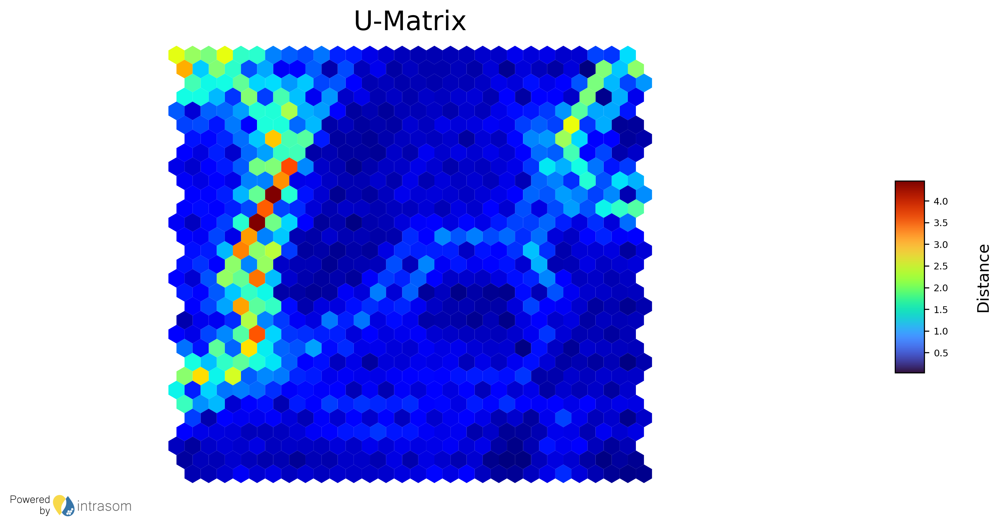

Saving.


In [17]:
# Visualizing the SOM units

plot = PlotFactory(som_test)

# U-matrix
plot.plot_umatrix(figsize = (13,2.5),
                  hits = False,
                  title = "U-Matrix",
                  title_size = 20,
                  title_pad = 20,
                  legend_title = "Distance",
                  legend_title_size = 12,
                  legend_ticks_size = 7,
                  label_title_xy = (0,0.5),
                  save = True,
                  file_name = "umatrix",
                  file_path = '',
                  watermark_neurons=False)

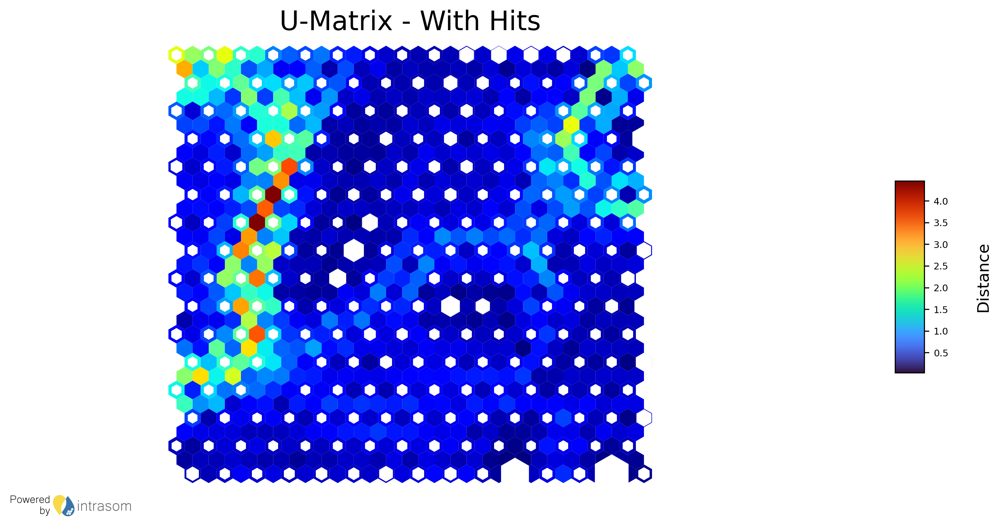

Saving.


In [18]:
# u-matrix with hits
plot.plot_umatrix(figsize = (13,2.5),
                  hits = True,
                  title = "U-Matrix - With Hits",
                  title_size = 20,
                  title_pad = 20,
                  legend_title = "Distance",
                  legend_title_size = 12,
                  legend_ticks_size = 7,
                  label_title_xy = (0,0.5),
                  save = True,
                  file_name = "umatrix_hits",
                  file_path = False,
                  watermark_neurons=False)



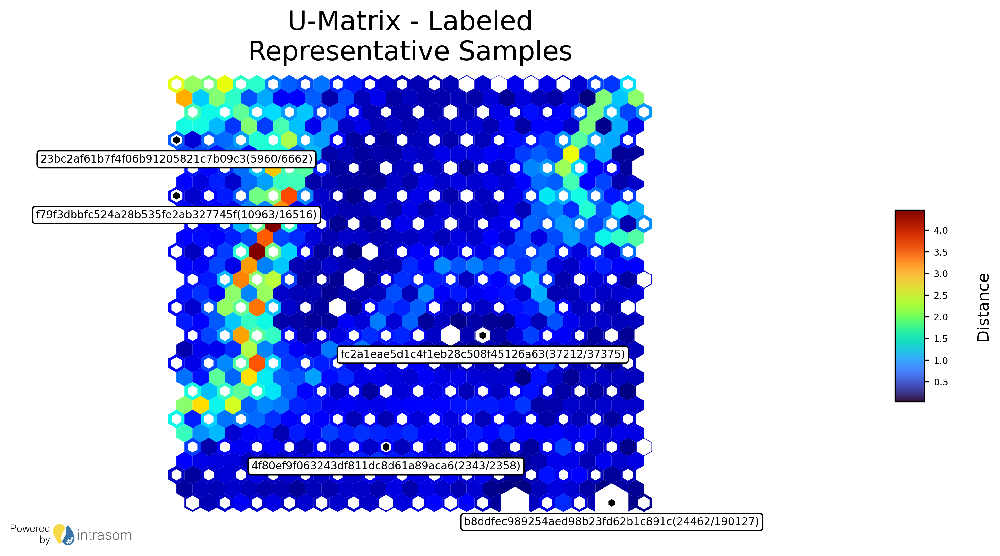

In [19]:
# Plot with labelled representative samples
plot.plot_umatrix(figsize = (13,2.5),
                  hits = True,
                  title = "U-Matrix - Labeled Representative Samples",
                  title_size = 20,
                  title_pad = 20,
                  legend_title = "Distance",
                  legend_title_size = 12,
                  legend_ticks_size = 7,
                  label_title_xy = (0,0.5),
                  save = False,
                  file_name = "umatrix_sample_labels",
                  file_path = False,
                  watermark_neurons=False,
                  samples_label = True,
                  samples_label_index = range(18),
                  samples_label_fontsize = 8,
                 save_labels_rep = True)

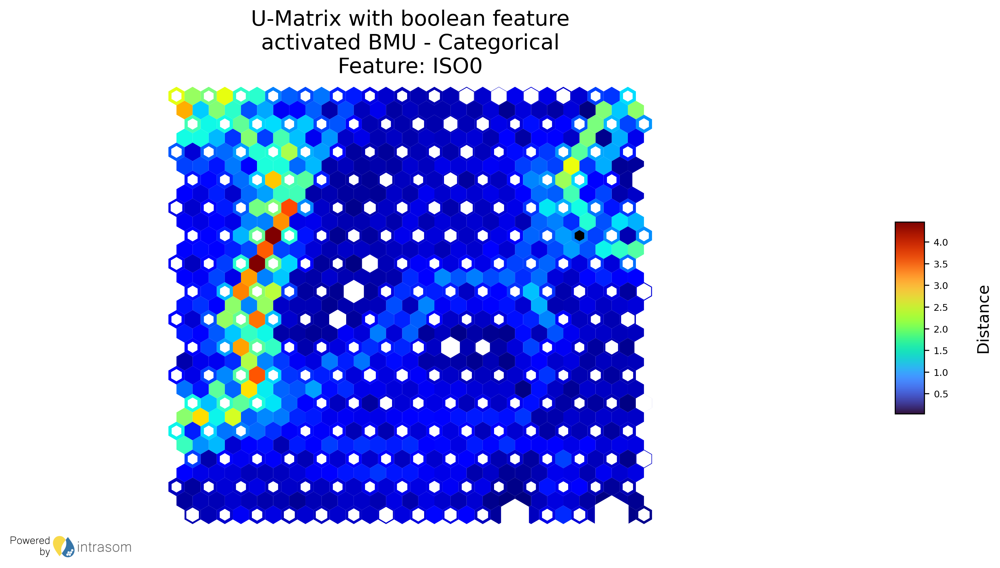

In [21]:
plot.plot_umatrix(figsize = (13,2.5),
                  hits = True,
                  title = "U-Matrix with boolean feature activated BMU - Categorical Feature: ISO0",
                  title_size = 16,
                  title_pad = 20,
                  legend_title = "Distance",
                  legend_title_size = 12,
                  legend_ticks_size = 7,
                  label_title_xy = (0,0.5),
                  save = False, #True,
                  file_name = "umatrix_var_labels",
                  file_path = False,
                  watermark_neurons=False,
                  label_plot = True,
                 label_plot_name = "ISO0")

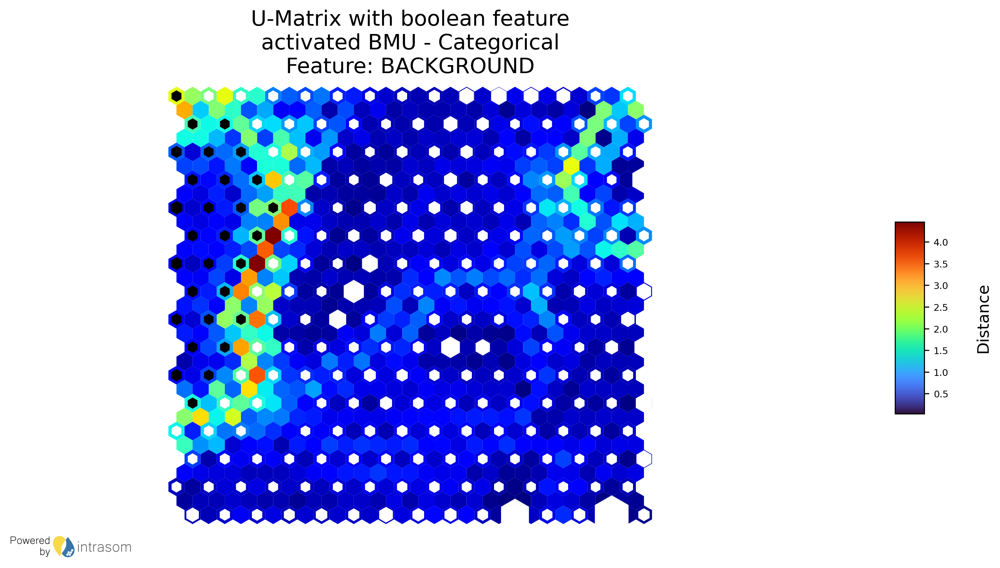

In [22]:
plot.plot_umatrix(figsize = (13,2.5),
                  hits = True,
                  title = "U-Matrix with boolean feature activated BMU - Categorical Feature: BACKGROUND",
                  title_size = 16,
                  title_pad = 20,
                  legend_title = "Distance",
                  legend_title_size = 12,
                  legend_ticks_size = 7,
                  label_title_xy = (0,0.5),
                  save = False, #True,
                  file_name = "umatrix_var_labels",
                  file_path = False,
                  watermark_neurons=False,
                  label_plot = True,
                 label_plot_name = "BACKGROUND")

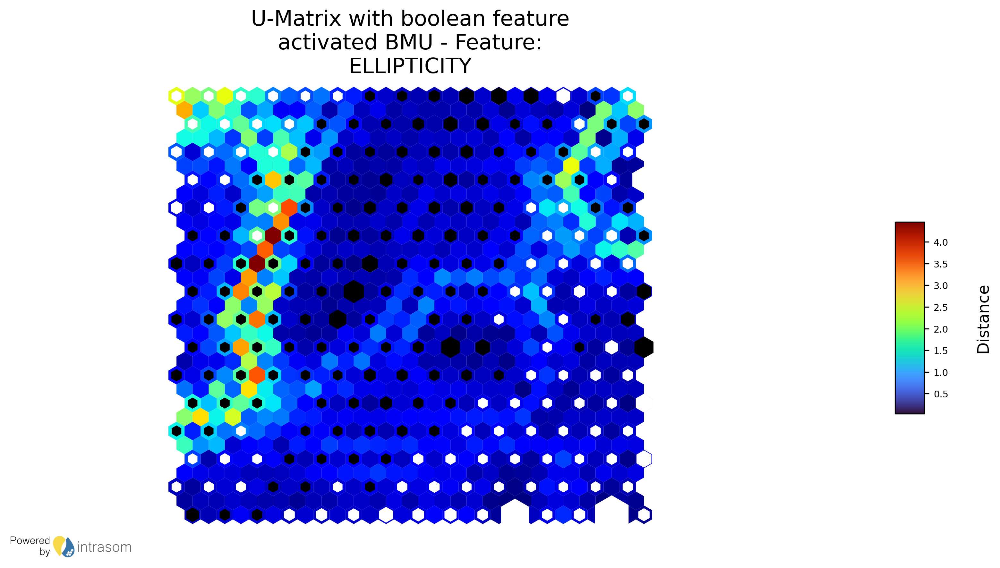

In [25]:
plot.plot_umatrix(figsize = (13,2.5),
                  hits = True,
                  title = "U-Matrix with boolean feature activated BMU - Feature: ELLIPTICITY",
                  title_size = 16,
                  title_pad = 20,
                  legend_title = "Distance",
                  legend_title_size = 12,
                  legend_ticks_size = 7,
                  label_title_xy = (0,0.5),
                  save = False, #True,
                  file_name = "umatrix_var_labels",
                  file_path = False,
                  watermark_neurons=False,
                  label_plot = True,
                 label_plot_name = "ELLIPTICITY")